In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import networkx as nx
import matplotlib.pyplot as plt

In [3]:
from sklearn.cluster import KMeans

In [4]:
import math

In [5]:
absolute_path = 'Data/data2/'

In [6]:
# Read facebook dataset
plt.figure(figsize=(30,20))
G=nx.read_edgelist('Data/fbData.txt',create_using=nx.Graph(),nodetype=int)

<Figure size 3000x2000 with 0 Axes>

In [7]:
row = G.number_of_nodes()

In [8]:
row

4039

In [9]:
edge_mat= nx.to_numpy_array(G, nodelist=[i for i in range(row)])

In [10]:
print (edge_mat)

[[0. 1. 1. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [11]:
#Read our decision Matrix
data = pd.read_csv("Data/Matrix.csv")
data

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [12]:
k=data.sort_values(by = ['w_Node'])
#data.to_csv("data.csv",index=False)

In [13]:
k

,Node,w_Node,DC,BC,CC,EC
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [14]:
k.to_csv("data.csv",index=False)

In [15]:
X = data[["DC","BC","CC","EC"]]


In [16]:
X

,DC,BC,CC,EC
0,0.085934,1.463059e-01,0.353343,3.391796e-05
1,0.004210,2.783274e-06,0.261376,6.045346e-07
2,0.002476,7.595021e-08,0.261258,2.233461e-07
3,0.004210,1.685066e-06,0.261376,6.635648e-07
4,0.002476,1.840332e-07,0.261258,2.236416e-07
...,...,...,...,...
4034,0.000495,0.000000e+00,0.183989,2.951270e-10
4035,0.000248,0.000000e+00,0.183980,2.912901e-10
4036,0.000495,0.000000e+00,0.183989,2.931223e-10
4037,0.000991,7.156847e-08,0.184005,2.989233e-10


In [18]:
influential = pd.read_csv("Data/w_Out1.csv")
inf10 = influential.head(12)
inf10

,Node,w_Node,DC,BC,CC,EC,C
0,107,107,0.258791,0.480518,0.459699,2.606940e-04,0.927913
1,1684,1684,0.196137,0.337797,0.393606,7.164260e-06,0.696069
2,3437,3437,0.135463,0.236115,0.314413,9.531613e-08,0.488526
3,1912,1912,0.186974,0.229295,0.350947,9.540696e-02,0.480827
4,1085,1085,0.016345,0.149015,0.357852,3.164082e-06,0.308478
5,0,0,0.085934,0.146306,0.353343,3.391796e-05,0.303198
6,698,698,0.016840,0.115330,0.271189,1.116876e-09,0.238868
7,567,567,0.015602,0.096310,0.328881,9.932295e-06,0.199523
8,58,58,0.002972,0.084360,0.397402,5.898120e-04,0.174775
9,428,428,0.028479,0.064309,0.394837,5.990065e-04,0.133340


In [19]:
Y = inf10[["DC","BC","CC","EC"]]
Yrr = Y.to_numpy()
Yrr

array([[2.58791481e-01, 4.80518079e-01, 4.59699454e-01, 2.60693991e-04],
       [1.96136701e-01, 3.37797450e-01, 3.93605615e-01, 7.16425979e-06],
       [1.35463101e-01, 2.36115357e-01, 3.14412520e-01, 9.53161293e-08],
       [1.86973749e-01, 2.29295340e-01, 3.50947332e-01, 9.54069615e-02],
       [1.63447251e-02, 1.49015092e-01, 3.57851826e-01, 3.16408207e-06],
       [8.59336305e-02, 1.46305921e-01, 3.53342667e-01, 3.39179617e-05],
       [1.68400198e-02, 1.15330450e-01, 2.71188717e-01, 1.11687629e-09],
       [1.56017831e-02, 9.63103312e-02, 3.28880925e-01, 9.93229483e-06],
       [2.97176820e-03, 8.43602059e-02, 3.97401831e-01, 5.89812015e-04],
       [2.84794453e-02, 6.43090624e-02, 3.94837196e-01, 5.99006469e-04],
       [2.25359089e-02, 6.27802285e-02, 3.93912789e-01, 6.01194972e-04],
       [4.95294700e-04, 5.78259069e-02, 3.14927468e-01, 4.60121163e-08]])

In [20]:
Sum_of_squared_distances = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k, n_init=1000)
    km = km.fit(X)
    Sum_of_squared_distances.append(km.inertia_)

KeyboardInterrupt: 

In [ ]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [ ]:
#K Optimal
from kneed import KneeLocator

kn = KneeLocator(K, Sum_of_squared_distances, curve='convex', direction='decreasing')
print(kn.knee)

In [65]:
#User
K = int(input("Enter the number of the top influential nodes:"))

Enter the number of the top influential nodes:14


In [67]:
kmeans = KMeans(n_clusters=K, init='k-means++', max_iter=20000, n_init=14, random_state=0).fit(X)

In [68]:
#Communities
label=kmeans.fit_predict(X)
for i in (label):
    print(i)

12
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
2
6
6
6
6
6
6
6
6
6
6
6
6
0
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
2
6
12
6
6
6
6
6
10
6
6
2
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
5
6
6
6
6
6
6
6
6
6
6
6
2
10
6
2
6
6
10
6
6
6
6
6
6
6
6
6
6
2
6
6
6
6
6
6
6
6
6
10
6
6
6
10
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
10
6
9
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
10
6
6
6
6
6
6
10
6
6
6
6
6
6
2
6
10
6
6
6
6
6
6
6
6
6
6
6
6
6
6
10
6
6
6
6
6
6
6
6
12
12
12
7
7
0
0
0
0
0
0
9
11
9
9
11
9
9
8
9
9
9
11
12
9
9
11
9
9
0
8
9
0
9
8
11
0
0
0
0
0
0
0
0
11
0
9
0
0
0
0
0
0
9
8
8
0
0
0
9
0
0
0
8
0
11
0
0
9
0
11
0
11
0
0
0
0
0
0
11
11
0
0
0
8
11
0
0
0
9
11
11
11
0
0
11
0
0
11
0
9
0
0
0
11
11
0
0
0
0
0
0
0
11
0
0
11
0
8
0
11
11
0
0
0
0


In [69]:
#centroîds after KMeans
centr = kmeans.cluster_centers_
centr

array([[5.26250619e-03, 1.24502418e-04, 3.15556531e-01, 3.60624971e-06],
       [4.41450817e-03, 1.69327300e-04, 2.36614830e-01, 1.24991277e-09],
       [2.28088838e-02, 2.24042685e-04, 2.84155601e-01, 2.17011836e-03],
       [3.62042827e-03, 1.74262941e-06, 1.79971031e-01, 1.00765152e-10],
       [2.81735280e-02, 4.98172791e-06, 2.61694555e-01, 4.93836594e-02],
       [2.58791481e-01, 4.80518079e-01, 4.59699454e-01, 2.60693991e-04],
       [4.96826242e-03, 7.99363166e-06, 2.62924790e-01, 6.93894348e-04],
       [1.72857850e-01, 2.67736049e-01, 3.52988489e-01, 3.18047404e-02],
       [3.79866874e-02, 2.77577910e-04, 3.21393140e-01, 7.04322404e-05],
       [1.11970630e-02, 9.68426077e-04, 3.39151753e-01, 6.91285966e-05],
       [5.97764942e-03, 1.04990622e-04, 2.82756080e-01, 9.79002803e-05],
       [1.86484624e-02, 6.72295952e-05, 3.16769985e-01, 2.11771316e-05],
       [3.32072583e-02, 8.01063944e-02, 3.59155714e-01, 1.23187632e-03],
       [4.47491786e-02, 1.30000407e-04, 2.63663888e

In [70]:
def distance_euclidean(data,center,j):
    T= pd.DataFrame()
    for i in range(len(data)):
        distance=math.sqrt((data['DC'][i]-center[j][0])**2+(data['BC'][i]-center[j][1])**2+
                           (data['CC'][i]-center[j][2])**2+(data['EC'][i]-center[j][3])**2)
        T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
    return T.sort_values(by='distance from center')

In [71]:
Res= pd.DataFrame()
for i in range(K):
    T=distance_euclidean(data,centr,i)
    Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
                    'Node_after_KMeans':int(T.head(1)['Node']),
                    'distance from center':float(T.head(1)['distance from center'])},ignore_index=True)

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\2395719865.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureW

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\2395719865.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureW

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\2395719865.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Res=Res.append({'cluster':str(i), 'Node_before_KMeans':str(inf10['Node'][i]),
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureW

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_14648\3092545731.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  T=T.append({'Node':data['Node'][i], 'cluster':str(j),'distance from center':distance},ignore_index=True)
C:\Users\wail_maghrane\AppData\Local\Temp\ipykernel_146

KeyError: 12

In [72]:
Res

,cluster,Node_before_KMeans,Node_after_KMeans,distance from center
0,0,107,1127,0.000177
1,1,1684,3662,0.002842
2,2,3437,2927,0.002183
3,3,1912,765,0.001527
4,4,1085,2477,0.000745
5,5,0,107,0.000000
6,6,698,88,0.001651
7,7,567,3437,0.069985
8,8,58,1813,0.001621
9,9,428,1545,0.002395


In [73]:
Res["Node_after_KMeans"] = Res["Node_after_KMeans"].astype(int)

In [74]:
Res["Node_after_KMeans"]

0     1127
1     3662
2     2927
3      765
4     2477
5      107
6       88
7     3437
8     1813
9     1545
10    2795
11    1280
Name: Node_after_KMeans, dtype: int32

In [75]:
Res["Node_after_KMeans"]

0     1127
1     3662
2     2927
3      765
4     2477
5      107
6       88
7     3437
8     1813
9     1545
10    2795
11    1280
Name: Node_after_KMeans, dtype: int32

In [76]:
#convert to DataFrame
lab = pd.DataFrame(label, columns=['center'])
lab

,center
0,12
1,6
2,6
3,6
4,6
...,...
4034,3
4035,3
4036,3
4037,3


In [77]:
#Community of each Node
community = pd.concat([data, lab], axis=1)
community.head(40)


,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,12
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,6
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,6
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,6
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,6
5,5,5,0.003219,2.205964e-06,0.261308,1.183322e-06,6
6,6,6,0.001486,2.453776e-08,0.261190,2.170904e-07,6
7,7,7,0.004953,1.702985e-04,0.274769,2.568510e-05,10
8,8,8,0.001981,2.760498e-07,0.261224,2.197375e-07,6
9,9,9,0.014116,1.645424e-05,0.262055,2.214117e-06,6


In [78]:
gk = community.groupby('center')
n=gk.first()
n

,Node,w_Node,DC,BC,CC,EC
center,,,,,,
0,34,34,0.001238,0.003602,0.303313,4.074185e-06
1,3980,3980,0.014611,0.024820,0.225448,4.722356e-08
2,21,21,0.016097,0.000938,0.275613,2.596576e-05
3,687,687,0.006934,0.000004,0.178562,7.184894e-13
4,1925,1925,0.030956,0.000006,0.261885,5.458889e-02
5,107,107,0.258791,0.480518,0.459699,2.606940e-04
6,1,1,0.004210,0.000003,0.261376,6.045346e-07
7,1684,1684,0.196137,0.337797,0.393606,7.164260e-06
8,483,483,0.057207,0.010308,0.369848,1.385700e-05


In [79]:
commNum = community['Node'].to_numpy()

In [80]:
 community

,Node,w_Node,DC,BC,CC,EC,center
0,0,0,0.085934,1.463059e-01,0.353343,3.391796e-05,12
1,1,1,0.004210,2.783274e-06,0.261376,6.045346e-07,6
2,2,2,0.002476,7.595021e-08,0.261258,2.233461e-07,6
3,3,3,0.004210,1.685066e-06,0.261376,6.635648e-07,6
4,4,4,0.002476,1.840332e-07,0.261258,2.236416e-07,6
...,...,...,...,...,...,...,...
4034,4034,4034,0.000495,0.000000e+00,0.183989,2.951270e-10,3
4035,4035,4035,0.000248,0.000000e+00,0.183980,2.912901e-10,3
4036,4036,4036,0.000495,0.000000e+00,0.183989,2.931223e-10,3
4037,4037,4037,0.000991,7.156847e-08,0.184005,2.989233e-10,3


In [81]:
recomm = Res["Node_after_KMeans"]
recomm

0     1127
1     3662
2     2927
3      765
4     2477
5      107
6       88
7     3437
8     1813
9     1545
10    2795
11    1280
Name: Node_after_KMeans, dtype: int32

In [82]:
recomm[11]

1280

In [84]:
df1=[]
df2=[]
df3=[]
df4=[]
df5=[]
for i in range(K-1):
    for j in range(row):
        if (recomm[i] == data['Node'][j]):
            df1.append(data['Node'][j].tolist())
            df2.append(data['DC'][j].tolist())
            df3.append(data['BC'][j].tolist())
            df4.append(data['CC'][j].tolist())
            df5.append(data['EC'][j].tolist())

            
#df = pd.DataFrame(df1,df2,df3,df4,df5,columns = ['Node','DC','BC','CC','EC'])
list1 = [df1,df2,df3,df4,df5]

KeyError: 12

In [85]:
dff1 = pd.DataFrame(df1,columns = ['Node'])
dff2 = pd.DataFrame(df2,columns = ['DC'])
dff3 = pd.DataFrame(df3,columns = ['BC'])
dff4 = pd.DataFrame(df4,columns = ['CC'])
dff5 = pd.DataFrame(df5,columns = ['EC'])

In [86]:
Final_Tab = pd.concat([dff1,dff2,dff3,dff4,dff5],axis=1)
Final_Tab

,Node,DC,BC,CC,EC
0,1127,0.005201,3.267136e-06,0.315444,2.132087e-06
1,3662,0.004210,3.010257e-06,0.239445,6.983698e-10
2,2927,0.022784,1.663649e-05,0.284266,9.805797e-08
3,765,0.003467,5.872766e-07,0.178451,3.927426e-13
4,2477,0.027984,1.268852e-06,0.261681,5.010379e-02
5,107,0.258791,4.805181e-01,0.459699,2.606940e-04
6,88,0.004953,4.549846e-06,0.261427,7.788174e-07
7,3437,0.135463,2.361154e-01,0.314413,9.531613e-08
8,1813,0.038633,1.010468e-04,0.319918,6.765361e-05
9,1545,0.010649,2.051291e-04,0.336949,6.934683e-06


In [87]:
FF = pd.DataFrame(Final_Tab.loc[1])
FF.T

,Node,DC,BC,CC,EC
1,3662.0,0.00421,0.000003,0.239445,6.983698e-10


In [88]:
#Regrouper les communitées dans une  list comm
#à l'intérieur de chaque liste on trouve les noeuds appartient à une communauté 
comm = []
for i in range(K):
    comm.append(gk.get_group(i)['Node'].tolist())


In [89]:
print("Nodes of community 4 ",comm[4],"\nNode of community 5 ",comm[5])

Nodes of community 4  [1925, 1953, 1963, 1989, 1997, 2046, 2055, 2056, 2058, 2060, 2063, 2077, 2084, 2086, 2098, 2109, 2115, 2136, 2164, 2165, 2179, 2210, 2212, 2213, 2216, 2237, 2261, 2287, 2300, 2306, 2307, 2329, 2334, 2353, 2386, 2391, 2392, 2407, 2418, 2429, 2462, 2467, 2469, 2477, 2478, 2484, 2485, 2489, 2495, 2499, 2506, 2521, 2532, 2536, 2539, 2546, 2552, 2554, 2556, 2563, 2574, 2575, 2579, 2591, 2606, 2623, 2631, 2646] 
Node of community 5  [107]


In [90]:
print("Nodes of community 7 ",comm[7],"\nNode of community 8 ",comm[8],"\nNode of community 9 ",comm[9])

Nodes of community 7  [1684, 1912, 3437] 
Node of community 8  [483, 637, 896, 916, 917, 925, 946, 980, 993, 1004, 1006, 1017, 1059, 1076, 1078, 1079, 1086, 1101, 1107, 1117, 1124, 1125, 1126, 1132, 1146, 1153, 1175, 1184, 1185, 1199, 1211, 1222, 1230, 1238, 1250, 1255, 1256, 1267, 1269, 1277, 1329, 1330, 1331, 1335, 1341, 1352, 1361, 1367, 1376, 1377, 1390, 1391, 1399, 1420, 1431, 1447, 1456, 1467, 1471, 1488, 1491, 1509, 1516, 1520, 1522, 1547, 1551, 1554, 1557, 1559, 1570, 1584, 1589, 1598, 1600, 1603, 1604, 1608, 1610, 1612, 1613, 1617, 1620, 1621, 1622, 1662, 1663, 1665, 1668, 1669, 1675, 1683, 1689, 1707, 1714, 1717, 1730, 1736, 1746, 1750, 1757, 1761, 1768, 1783, 1791, 1793, 1799, 1800, 1804, 1813, 1816, 1823, 1827, 1833, 1835, 1839, 1842, 1849, 1867, 1868, 1879, 1888, 1902] 
Node of community 9  [171, 353, 366, 376, 420, 475, 484, 517, 526, 566, 580, 601, 606, 641, 651, 908, 915, 921, 930, 951, 962, 990, 1013, 1028, 1029, 1070, 1074, 1077, 1088, 1098, 1109, 1114, 1136, 1165, 11

In [91]:
print("Nodes of community 0 ",comm[0],"\nNode of community 1 ",comm[1])

Nodes of community 0  [34, 2814, 2838, 2885, 3003, 3173, 3290, 629, 649, 898, 899, 900, 901, 902, 903, 904, 905, 907, 909, 910, 911, 912, 913, 914, 918, 919, 920, 922, 923, 924, 926, 928, 929, 931, 933, 935, 936, 937, 938, 939, 940, 943, 944, 945, 948, 949, 950, 955, 956, 958, 959, 961, 963, 964, 965, 968, 969, 970, 971, 972, 973, 974, 976, 977, 979, 981, 984, 985, 986, 987, 988, 989, 991, 992, 994, 996, 998, 1000, 1001, 1002, 1005, 1007, 1008, 1010, 1011, 1012, 1015, 1016, 1022, 1023, 1025, 1027, 1030, 1031, 1033, 1034, 1035, 1037, 1038, 1039, 1041, 1042, 1043, 1044, 1045, 1046, 1050, 1051, 1053, 1055, 1057, 1058, 1061, 1062, 1063, 1064, 1065, 1069, 1071, 1072, 1073, 1081, 1084, 1087, 1089, 1090, 1091, 1093, 1094, 1095, 1096, 1097, 1103, 1105, 1106, 1108, 1111, 1113, 1115, 1116, 1118, 1119, 1121, 1127, 1131, 1133, 1134, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1147, 1150, 1151, 1152, 1154, 1155, 1157, 1161, 1162, 1164, 1167, 1168, 1169, 1170, 1174, 1176, 1177, 1180, 1183,

In [92]:
Comm= []
for i in range(K):
    print("Nodes of Community [",i,"] =",comm[i])
    

Nodes of Community [ 0 ] = [34, 2814, 2838, 2885, 3003, 3173, 3290, 629, 649, 898, 899, 900, 901, 902, 903, 904, 905, 907, 909, 910, 911, 912, 913, 914, 918, 919, 920, 922, 923, 924, 926, 928, 929, 931, 933, 935, 936, 937, 938, 939, 940, 943, 944, 945, 948, 949, 950, 955, 956, 958, 959, 961, 963, 964, 965, 968, 969, 970, 971, 972, 973, 974, 976, 977, 979, 981, 984, 985, 986, 987, 988, 989, 991, 992, 994, 996, 998, 1000, 1001, 1002, 1005, 1007, 1008, 1010, 1011, 1012, 1015, 1016, 1022, 1023, 1025, 1027, 1030, 1031, 1033, 1034, 1035, 1037, 1038, 1039, 1041, 1042, 1043, 1044, 1045, 1046, 1050, 1051, 1053, 1055, 1057, 1058, 1061, 1062, 1063, 1064, 1065, 1069, 1071, 1072, 1073, 1081, 1084, 1087, 1089, 1090, 1091, 1093, 1094, 1095, 1096, 1097, 1103, 1105, 1106, 1108, 1111, 1113, 1115, 1116, 1118, 1119, 1121, 1127, 1131, 1133, 1134, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1147, 1150, 1151, 1152, 1154, 1155, 1157, 1161, 1162, 1164, 1167, 1168, 1169, 1170, 1174, 1176, 1177, 1180, 

34
2814
2838
 	 node 2838 is connected with :3003
2885
 	 node 2885 is connected with :3290
3003
 	 node 3003 is connected with :2838
3173
3290
 	 node 3290 is connected with :2885
629
 	 node 629 is connected with :1223
 	 node 629 is connected with :1400
 	 node 629 is connected with :1679
 	 node 629 is connected with :1850
649
 	 node 649 is connected with :1023
 	 node 649 is connected with :1694
898
 	 node 898 is connected with :919
 	 node 898 is connected with :969
 	 node 898 is connected with :971
 	 node 898 is connected with :1081
 	 node 898 is connected with :1108
 	 node 898 is connected with :1309
 	 node 898 is connected with :1316
 	 node 898 is connected with :1382
 	 node 898 is connected with :1406
 	 node 898 is connected with :1595
 	 node 898 is connected with :1848
 	 node 898 is connected with :1875
899
 	 node 899 is connected with :1133
 	 node 899 is connected with :1442
900
 	 node 900 is connected with :919
 	 node 900 is connected with :1615
 	 node 900

988
 	 node 988 is connected with :981
 	 node 988 is connected with :1190
 	 node 988 is connected with :1279
 	 node 988 is connected with :1438
 	 node 988 is connected with :1873
989
 	 node 989 is connected with :1044
 	 node 989 is connected with :1728
 	 node 989 is connected with :1875
991
 	 node 991 is connected with :922
 	 node 991 is connected with :1034
 	 node 991 is connected with :1177
 	 node 991 is connected with :1283
 	 node 991 is connected with :1561
 	 node 991 is connected with :1641
 	 node 991 is connected with :1701
992
 	 node 992 is connected with :901
 	 node 992 is connected with :903
 	 node 992 is connected with :938
 	 node 992 is connected with :963
 	 node 992 is connected with :1097
 	 node 992 is connected with :1118
 	 node 992 is connected with :1216
 	 node 992 is connected with :1314
 	 node 992 is connected with :1333
 	 node 992 is connected with :1363
 	 node 992 is connected with :1371
 	 node 992 is connected with :1378
 	 node 992 is con

 	 node 1072 is connected with :1815
 	 node 1072 is connected with :1904
1073
 	 node 1073 is connected with :970
 	 node 1073 is connected with :1008
 	 node 1073 is connected with :1023
 	 node 1073 is connected with :1325
 	 node 1073 is connected with :1908
1081
 	 node 1081 is connected with :898
 	 node 1081 is connected with :969
 	 node 1081 is connected with :1704
1084
 	 node 1084 is connected with :1519
1087
 	 node 1087 is connected with :961
 	 node 1087 is connected with :996
 	 node 1087 is connected with :1283
 	 node 1087 is connected with :1838
1089
 	 node 1089 is connected with :964
 	 node 1089 is connected with :1005
 	 node 1089 is connected with :1168
 	 node 1089 is connected with :1213
 	 node 1089 is connected with :1259
 	 node 1089 is connected with :1354
 	 node 1089 is connected with :1415
 	 node 1089 is connected with :1507
 	 node 1089 is connected with :1624
 	 node 1089 is connected with :1667
 	 node 1089 is connected with :1672
1090
 	 node 1090 i

1177
 	 node 1177 is connected with :956
 	 node 1177 is connected with :979
 	 node 1177 is connected with :987
 	 node 1177 is connected with :991
 	 node 1177 is connected with :1016
 	 node 1177 is connected with :1138
 	 node 1177 is connected with :1218
 	 node 1177 is connected with :1403
 	 node 1177 is connected with :1424
 	 node 1177 is connected with :1436
 	 node 1177 is connected with :1499
 	 node 1177 is connected with :1641
 	 node 1177 is connected with :1889
 	 node 1177 is connected with :1896
1180
 	 node 1180 is connected with :1001
1183
 	 node 1183 is connected with :913
 	 node 1183 is connected with :968
 	 node 1183 is connected with :1051
 	 node 1183 is connected with :1053
 	 node 1183 is connected with :1062
 	 node 1183 is connected with :1127
 	 node 1183 is connected with :1223
 	 node 1183 is connected with :1246
 	 node 1183 is connected with :1343
 	 node 1183 is connected with :1436
 	 node 1183 is connected with :1444
 	 node 1183 is connected wit

1265
 	 node 1265 is connected with :1460
 	 node 1265 is connected with :1484
1266
 	 node 1266 is connected with :1050
 	 node 1266 is connected with :1055
 	 node 1266 is connected with :1138
 	 node 1266 is connected with :1434
 	 node 1266 is connected with :1441
 	 node 1266 is connected with :1564
 	 node 1266 is connected with :1585
 	 node 1266 is connected with :1779
 	 node 1266 is connected with :1822
 	 node 1266 is connected with :1905
1268
 	 node 1268 is connected with :1200
 	 node 1268 is connected with :1202
 	 node 1268 is connected with :1343
 	 node 1268 is connected with :1529
 	 node 1268 is connected with :1531
 	 node 1268 is connected with :1814
 	 node 1268 is connected with :1910
1270
 	 node 1270 is connected with :1711
1276
1278
 	 node 1278 is connected with :964
 	 node 1278 is connected with :1524
 	 node 1278 is connected with :1572
 	 node 1278 is connected with :1771
1279
 	 node 1279 is connected with :902
 	 node 1279 is connected with :981
 	 nod

1368
 	 node 1368 is connected with :909
 	 node 1368 is connected with :955
 	 node 1368 is connected with :1030
 	 node 1368 is connected with :1043
 	 node 1368 is connected with :1045
 	 node 1368 is connected with :1111
 	 node 1368 is connected with :1254
 	 node 1368 is connected with :1788
1371
 	 node 1371 is connected with :901
 	 node 1371 is connected with :903
 	 node 1371 is connected with :958
 	 node 1371 is connected with :963
 	 node 1371 is connected with :987
 	 node 1371 is connected with :992
 	 node 1371 is connected with :1097
 	 node 1371 is connected with :1118
 	 node 1371 is connected with :1137
 	 node 1371 is connected with :1216
 	 node 1371 is connected with :1223
 	 node 1371 is connected with :1232
 	 node 1371 is connected with :1319
 	 node 1371 is connected with :1333
 	 node 1371 is connected with :1363
 	 node 1371 is connected with :1378
 	 node 1371 is connected with :1452
 	 node 1371 is connected with :1468
 	 node 1371 is connected with :1533

 	 node 1468 is connected with :901
 	 node 1468 is connected with :903
 	 node 1468 is connected with :938
 	 node 1468 is connected with :958
 	 node 1468 is connected with :963
 	 node 1468 is connected with :992
 	 node 1468 is connected with :1097
 	 node 1468 is connected with :1118
 	 node 1468 is connected with :1137
 	 node 1468 is connected with :1216
 	 node 1468 is connected with :1232
 	 node 1468 is connected with :1319
 	 node 1468 is connected with :1333
 	 node 1468 is connected with :1371
 	 node 1468 is connected with :1378
 	 node 1468 is connected with :1452
 	 node 1468 is connected with :1493
 	 node 1468 is connected with :1533
 	 node 1468 is connected with :1548
 	 node 1468 is connected with :1568
 	 node 1468 is connected with :1601
 	 node 1468 is connected with :1648
 	 node 1468 is connected with :1733
 	 node 1468 is connected with :1787
 	 node 1468 is connected with :1798
 	 node 1468 is connected with :1802
 	 node 1468 is connected with :1837
 	 node

 	 node 1582 is connected with :1309
 	 node 1582 is connected with :1324
 	 node 1582 is connected with :1382
 	 node 1582 is connected with :1451
 	 node 1582 is connected with :1728
 	 node 1582 is connected with :1812
 	 node 1582 is connected with :1848
1585
 	 node 1585 is connected with :1050
 	 node 1585 is connected with :1055
 	 node 1585 is connected with :1266
 	 node 1585 is connected with :1337
 	 node 1585 is connected with :1434
 	 node 1585 is connected with :1441
 	 node 1585 is connected with :1477
 	 node 1585 is connected with :1544
 	 node 1585 is connected with :1564
 	 node 1585 is connected with :1779
 	 node 1585 is connected with :1822
 	 node 1585 is connected with :1860
 	 node 1585 is connected with :1905
1586
 	 node 1586 is connected with :1046
 	 node 1586 is connected with :1194
1592
 	 node 1592 is connected with :1015
 	 node 1592 is connected with :1229
 	 node 1592 is connected with :1438
1594
 	 node 1594 is connected with :1157
 	 node 1594 is co

1693
 	 node 1693 is connected with :1240
 	 node 1693 is connected with :1760
1694
 	 node 1694 is connected with :649
 	 node 1694 is connected with :931
 	 node 1694 is connected with :1064
 	 node 1694 is connected with :1212
 	 node 1694 is connected with :1234
 	 node 1694 is connected with :1296
 	 node 1694 is connected with :1343
 	 node 1694 is connected with :1356
 	 node 1694 is connected with :1453
 	 node 1694 is connected with :1478
 	 node 1694 is connected with :1514
 	 node 1694 is connected with :1743
 	 node 1694 is connected with :1790
 	 node 1694 is connected with :1831
 	 node 1694 is connected with :1910
1695
 	 node 1695 is connected with :948
 	 node 1695 is connected with :1113
 	 node 1695 is connected with :1142
 	 node 1695 is connected with :1318
 	 node 1695 is connected with :1332
 	 node 1695 is connected with :1464
 	 node 1695 is connected with :1565
 	 node 1695 is connected with :1602
 	 node 1695 is connected with :1606
 	 node 1695 is connected 

1805
 	 node 1805 is connected with :922
 	 node 1805 is connected with :1337
 	 node 1805 is connected with :1858
1812
 	 node 1812 is connected with :1108
 	 node 1812 is connected with :1229
 	 node 1812 is connected with :1309
 	 node 1812 is connected with :1382
 	 node 1812 is connected with :1582
1814
 	 node 1814 is connected with :968
 	 node 1814 is connected with :1162
 	 node 1814 is connected with :1268
 	 node 1814 is connected with :1497
 	 node 1814 is connected with :1566
 	 node 1814 is connected with :1599
 	 node 1814 is connected with :1696
 	 node 1814 is connected with :1731
1815
 	 node 1815 is connected with :944
 	 node 1815 is connected with :977
 	 node 1815 is connected with :1011
 	 node 1815 is connected with :1041
 	 node 1815 is connected with :1072
 	 node 1815 is connected with :1131
 	 node 1815 is connected with :1139
 	 node 1815 is connected with :1236
 	 node 1815 is connected with :1258
 	 node 1815 is connected with :1259
 	 node 1815 is connec

360
 	 node 360 is connected with :387
 	 node 360 is connected with :520
387
 	 node 387 is connected with :360
 	 node 387 is connected with :520
392
416
439
 	 node 439 is connected with :451
 	 node 439 is connected with :471
 	 node 439 is connected with :520
451
 	 node 451 is connected with :439
 	 node 451 is connected with :471
471
 	 node 471 is connected with :439
 	 node 471 is connected with :451
520
 	 node 520 is connected with :360
 	 node 520 is connected with :387
 	 node 520 is connected with :439
591
 	 node 591 is connected with :604
 	 node 591 is connected with :645
 	 node 591 is connected with :683
604
 	 node 604 is connected with :591
 	 node 604 is connected with :645
645
 	 node 645 is connected with :591
 	 node 645 is connected with :604
 	 node 645 is connected with :683
683
 	 node 683 is connected with :591
 	 node 683 is connected with :645
860
Done adding k_0


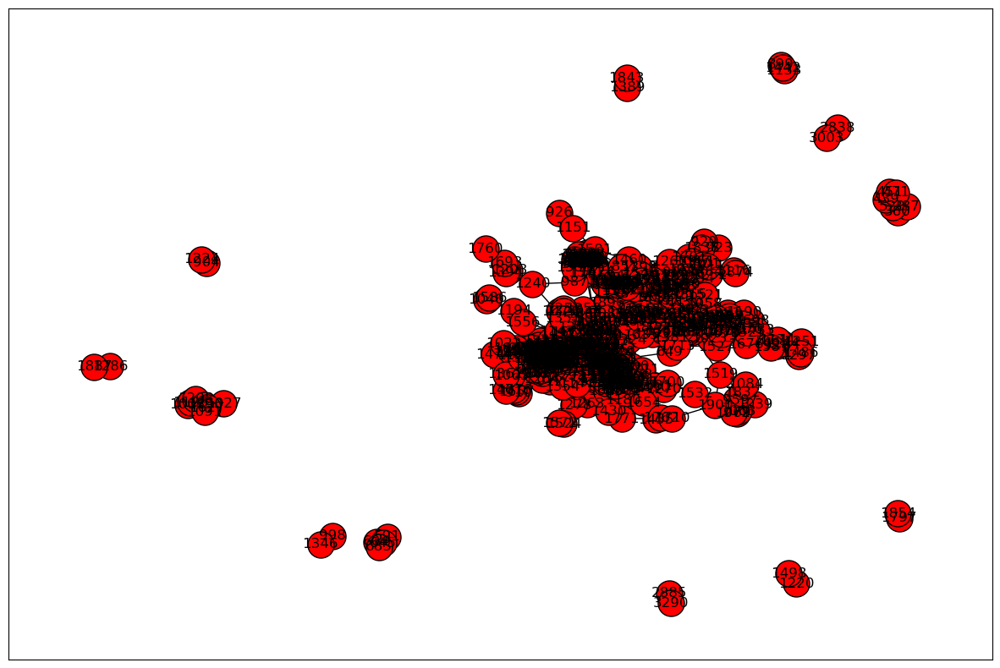

3980
 	 node 3980 is connected with :3989
 	 node 3980 is connected with :4011
 	 node 3980 is connected with :4031
3989
 	 node 3989 is connected with :3980
 	 node 3989 is connected with :4011
4011
 	 node 4011 is connected with :3980
 	 node 4011 is connected with :3989
 	 node 4011 is connected with :4031
4031
 	 node 4031 is connected with :3980
 	 node 4031 is connected with :4011
686
 	 node 686 is connected with :697
 	 node 686 is connected with :703
 	 node 686 is connected with :708
 	 node 686 is connected with :713
 	 node 686 is connected with :719
 	 node 686 is connected with :729
 	 node 686 is connected with :745
 	 node 686 is connected with :747
 	 node 686 is connected with :753
 	 node 686 is connected with :769
 	 node 686 is connected with :772
 	 node 686 is connected with :774
 	 node 686 is connected with :776
 	 node 686 is connected with :798
 	 node 686 is connected with :800
 	 node 686 is connected with :803
 	 node 686 is connected with :804
 	 node 686

875
876
 	 node 876 is connected with :729
 	 node 876 is connected with :804
 	 node 876 is connected with :856
 	 node 876 is connected with :861
 	 node 876 is connected with :863
 	 node 876 is connected with :878
 	 node 876 is connected with :882
 	 node 876 is connected with :886
 	 node 876 is connected with :888
 	 node 876 is connected with :889
877
 	 node 877 is connected with :776
 	 node 877 is connected with :867
 	 node 877 is connected with :885
878
 	 node 878 is connected with :729
 	 node 878 is connected with :804
 	 node 878 is connected with :856
 	 node 878 is connected with :861
 	 node 878 is connected with :863
 	 node 878 is connected with :876
 	 node 878 is connected with :886
 	 node 878 is connected with :888
 	 node 878 is connected with :889
879
 	 node 879 is connected with :866
 	 node 879 is connected with :870
 	 node 879 is connected with :871
 	 node 879 is connected with :881
 	 node 879 is connected with :894
880
 	 node 880 is connected with :

 	 node 3469 is connected with :3443
 	 node 3469 is connected with :3459
 	 node 3469 is connected with :3460
 	 node 3469 is connected with :3464
 	 node 3469 is connected with :3466
 	 node 3469 is connected with :3474
 	 node 3469 is connected with :3510
 	 node 3469 is connected with :3529
 	 node 3469 is connected with :3554
 	 node 3469 is connected with :3604
 	 node 3469 is connected with :3630
 	 node 3469 is connected with :3634
 	 node 3469 is connected with :3668
 	 node 3469 is connected with :3726
 	 node 3469 is connected with :3738
 	 node 3469 is connected with :3752
 	 node 3469 is connected with :3761
 	 node 3469 is connected with :3764
 	 node 3469 is connected with :3825
 	 node 3469 is connected with :3829
 	 node 3469 is connected with :3881
 	 node 3469 is connected with :3915
 	 node 3469 is connected with :3927
 	 node 3469 is connected with :3945
 	 node 3469 is connected with :3956
 	 node 3469 is connected with :3972
3470
 	 node 3470 is connected with :3

3526
 	 node 3526 is connected with :3442
 	 node 3526 is connected with :3455
 	 node 3526 is connected with :3471
 	 node 3526 is connected with :3472
 	 node 3526 is connected with :3475
 	 node 3526 is connected with :3505
 	 node 3526 is connected with :3520
 	 node 3526 is connected with :3521
 	 node 3526 is connected with :3543
 	 node 3526 is connected with :3553
 	 node 3526 is connected with :3559
 	 node 3526 is connected with :3563
 	 node 3526 is connected with :3573
 	 node 3526 is connected with :3590
 	 node 3526 is connected with :3599
 	 node 3526 is connected with :3629
 	 node 3526 is connected with :3685
 	 node 3526 is connected with :3698
 	 node 3526 is connected with :3713
 	 node 3526 is connected with :3722
 	 node 3526 is connected with :3753
 	 node 3526 is connected with :3769
 	 node 3526 is connected with :3773
 	 node 3526 is connected with :3831
 	 node 3526 is connected with :3840
 	 node 3526 is connected with :3850
 	 node 3526 is connected with :3

 	 node 3583 is connected with :3464
 	 node 3583 is connected with :3466
 	 node 3583 is connected with :3494
 	 node 3583 is connected with :3539
 	 node 3583 is connected with :3600
 	 node 3583 is connected with :3758
 	 node 3583 is connected with :3825
 	 node 3583 is connected with :3869
 	 node 3583 is connected with :3931
3584
 	 node 3584 is connected with :3458
 	 node 3584 is connected with :3468
 	 node 3584 is connected with :3493
 	 node 3584 is connected with :3506
 	 node 3584 is connected with :3524
 	 node 3584 is connected with :3535
 	 node 3584 is connected with :3539
 	 node 3584 is connected with :3555
 	 node 3584 is connected with :3558
 	 node 3584 is connected with :3593
 	 node 3584 is connected with :3617
 	 node 3584 is connected with :3620
 	 node 3584 is connected with :3631
 	 node 3584 is connected with :3643
 	 node 3584 is connected with :3646
 	 node 3584 is connected with :3690
 	 node 3584 is connected with :3711
 	 node 3584 is connected with :3

 	 node 3632 is connected with :3508
 	 node 3632 is connected with :3720
 	 node 3632 is connected with :3787
 	 node 3632 is connected with :3791
 	 node 3632 is connected with :3918
3634
 	 node 3634 is connected with :3443
 	 node 3634 is connected with :3460
 	 node 3634 is connected with :3464
 	 node 3634 is connected with :3466
 	 node 3634 is connected with :3469
 	 node 3634 is connected with :3474
 	 node 3634 is connected with :3510
 	 node 3634 is connected with :3529
 	 node 3634 is connected with :3554
 	 node 3634 is connected with :3593
 	 node 3634 is connected with :3602
 	 node 3634 is connected with :3630
 	 node 3634 is connected with :3738
 	 node 3634 is connected with :3752
 	 node 3634 is connected with :3761
 	 node 3634 is connected with :3829
 	 node 3634 is connected with :3915
 	 node 3634 is connected with :3937
 	 node 3634 is connected with :3945
 	 node 3634 is connected with :3956
 	 node 3634 is connected with :3972
3635
 	 node 3635 is connected wi

 	 node 3679 is connected with :3863
 	 node 3679 is connected with :3894
 	 node 3679 is connected with :3905
 	 node 3679 is connected with :3939
 	 node 3679 is connected with :3963
3680
 	 node 3680 is connected with :3463
 	 node 3680 is connected with :3464
 	 node 3680 is connected with :3466
 	 node 3680 is connected with :3468
 	 node 3680 is connected with :3486
 	 node 3680 is connected with :3493
 	 node 3680 is connected with :3499
 	 node 3680 is connected with :3506
 	 node 3680 is connected with :3554
 	 node 3680 is connected with :3564
 	 node 3680 is connected with :3568
 	 node 3680 is connected with :3569
 	 node 3680 is connected with :3591
 	 node 3680 is connected with :3593
 	 node 3680 is connected with :3617
 	 node 3680 is connected with :3643
 	 node 3680 is connected with :3645
 	 node 3680 is connected with :3690
 	 node 3680 is connected with :3706
 	 node 3680 is connected with :3711
 	 node 3680 is connected with :3714
 	 node 3680 is connected with :3

 	 node 3730 is connected with :3450
 	 node 3730 is connected with :3488
 	 node 3730 is connected with :3514
 	 node 3730 is connected with :3518
 	 node 3730 is connected with :3528
 	 node 3730 is connected with :3542
 	 node 3730 is connected with :3545
 	 node 3730 is connected with :3557
 	 node 3730 is connected with :3578
 	 node 3730 is connected with :3596
 	 node 3730 is connected with :3604
 	 node 3730 is connected with :3605
 	 node 3730 is connected with :3627
 	 node 3730 is connected with :3635
 	 node 3730 is connected with :3640
 	 node 3730 is connected with :3642
 	 node 3730 is connected with :3687
 	 node 3730 is connected with :3707
 	 node 3730 is connected with :3731
 	 node 3730 is connected with :3737
 	 node 3730 is connected with :3790
 	 node 3730 is connected with :3800
 	 node 3730 is connected with :3804
 	 node 3730 is connected with :3824
 	 node 3730 is connected with :3832
 	 node 3730 is connected with :3913
 	 node 3730 is connected with :3926
3

 	 node 3790 is connected with :3450
 	 node 3790 is connected with :3485
 	 node 3790 is connected with :3488
 	 node 3790 is connected with :3497
 	 node 3790 is connected with :3514
 	 node 3790 is connected with :3518
 	 node 3790 is connected with :3528
 	 node 3790 is connected with :3542
 	 node 3790 is connected with :3545
 	 node 3790 is connected with :3557
 	 node 3790 is connected with :3576
 	 node 3790 is connected with :3578
 	 node 3790 is connected with :3596
 	 node 3790 is connected with :3603
 	 node 3790 is connected with :3604
 	 node 3790 is connected with :3605
 	 node 3790 is connected with :3611
 	 node 3790 is connected with :3627
 	 node 3790 is connected with :3635
 	 node 3790 is connected with :3640
 	 node 3790 is connected with :3670
 	 node 3790 is connected with :3681
 	 node 3790 is connected with :3683
 	 node 3790 is connected with :3687
 	 node 3790 is connected with :3702
 	 node 3790 is connected with :3730
 	 node 3790 is connected with :3731
 

 	 node 3842 is connected with :3438
 	 node 3842 is connected with :3475
 	 node 3842 is connected with :3484
 	 node 3842 is connected with :3491
 	 node 3842 is connected with :3521
 	 node 3842 is connected with :3545
 	 node 3842 is connected with :3611
 	 node 3842 is connected with :3618
 	 node 3842 is connected with :3625
 	 node 3842 is connected with :3656
 	 node 3842 is connected with :3667
 	 node 3842 is connected with :3683
 	 node 3842 is connected with :3697
 	 node 3842 is connected with :3703
 	 node 3842 is connected with :3736
 	 node 3842 is connected with :3780
 	 node 3842 is connected with :3817
 	 node 3842 is connected with :3831
 	 node 3842 is connected with :3873
 	 node 3842 is connected with :3908
 	 node 3842 is connected with :3929
 	 node 3842 is connected with :3938
 	 node 3842 is connected with :3966
 	 node 3842 is connected with :3968
 	 node 3842 is connected with :3971
3843
 	 node 3843 is connected with :3499
 	 node 3843 is connected with :3

3899
 	 node 3899 is connected with :3571
 	 node 3899 is connected with :3675
 	 node 3899 is connected with :3757
 	 node 3899 is connected with :3774
 	 node 3899 is connected with :3836
 	 node 3899 is connected with :3957
3900
 	 node 3900 is connected with :3458
 	 node 3900 is connected with :3460
 	 node 3900 is connected with :3468
 	 node 3900 is connected with :3486
 	 node 3900 is connected with :3493
 	 node 3900 is connected with :3509
 	 node 3900 is connected with :3511
 	 node 3900 is connected with :3529
 	 node 3900 is connected with :3569
 	 node 3900 is connected with :3584
 	 node 3900 is connected with :3591
 	 node 3900 is connected with :3614
 	 node 3900 is connected with :3620
 	 node 3900 is connected with :3680
 	 node 3900 is connected with :3706
 	 node 3900 is connected with :3714
 	 node 3900 is connected with :3718
 	 node 3900 is connected with :3786
 	 node 3900 is connected with :3793
 	 node 3900 is connected with :3794
 	 node 3900 is connected wi

 	 node 3950 is connected with :3522
 	 node 3950 is connected with :3547
 	 node 3950 is connected with :3610
 	 node 3950 is connected with :3659
 	 node 3950 is connected with :3772
 	 node 3950 is connected with :3796
 	 node 3950 is connected with :3805
 	 node 3950 is connected with :3841
 	 node 3950 is connected with :3888
 	 node 3950 is connected with :3916
 	 node 3950 is connected with :3979
3951
 	 node 3951 is connected with :3458
 	 node 3951 is connected with :3463
 	 node 3951 is connected with :3486
 	 node 3951 is connected with :3493
 	 node 3951 is connected with :3506
 	 node 3951 is connected with :3509
 	 node 3951 is connected with :3558
 	 node 3951 is connected with :3569
 	 node 3951 is connected with :3584
 	 node 3951 is connected with :3591
 	 node 3951 is connected with :3593
 	 node 3951 is connected with :3643
 	 node 3951 is connected with :3646
 	 node 3951 is connected with :3680
 	 node 3951 is connected with :3711
 	 node 3951 is connected with :3

In [ ]:
for i in  range(K):
    with open(absolute_path+"k_"+ str(i) +".txt", 'w') as fp:
        for item in comm[i]:
            print(item)
            for j in range(row):
                if edge_mat[item][j]==1 and j in comm[i]:
                    items = str(item)+ ' ' +str(j)
                    fp.write( "%s\n" % items )
                    print(' \t node '+str(item) + ' is connected with :'+str(j))
        print( 'Done adding k_'+ str(i) )
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(i) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    plt.show()

In [ ]:
from math import *
import import_ipynb 
from TOPSIS import Topsis

In [ ]:

def apply_topsis(dx):    
    Graph = nx.read_edgelist(absolute_path+"k_"+ str(dx) +".txt",create_using=nx.Graph(),nodetype=int)
    sp = nx.spring_layout(Graph)
    nx.draw_networkx(Graph,pos=sp,node_color='red',with_labels=True,edgecolors='black',node_size=500)
    row = Graph.number_of_nodes()
    print(row)
    plt.rcParams.update({'figure.figsize': (15, 10)})
    deg_centrality = nx.degree_centrality(Graph)
    bet_centrality = nx.betweenness_centrality(Graph)
    close_centrality = nx.closeness_centrality(Graph)
    eig_centrality=nx.eigenvector_centrality(Graph)
    Matrix=pd.DataFrame()
    for noued in Graph:
    #add the name of each node with its measures centrality
        Matrix=Matrix.append({'Node':str(noued), 'DC':deg_centrality[noued], 'BC':bet_centrality[noued],
                        'CC':close_centrality[noued], 'EC':eig_centrality[noued]},ignore_index=True)
    Matrix.to_csv(absolute_path+"data/Matrix.csv" ,index=False)
    Matrix_arr= Matrix[['DC','BC','CC','EC']].to_numpy()
    m = row
    ev_matrix_np = Matrix_arr
    sum = np.zeros(4)

    for i in range(m):
        for j in range(4):
            sum[j] += ev_matrix_np[i][j]

    p = np.copy(ev_matrix_np)

    for i in range(m):
        for j in range(4):
            p[i][j] = ev_matrix_np[i][j]/sum[j]
    k = 1/log(m)
    E = []
    for j in range(4):
        temp_sum = 0
        for i in range(m):
            try:
                pij = p[i][j]
                temp_sum += pij*log(pij)
            except:
                pij = 1
                temp_sum += pij*log(pij)
        E.append(-k*temp_sum)
    D = []
    for i in range(4):
        D.append(1-E[i])
    sm = np.sum(D)
    weights = [D[i]/sm for i in range(4)]
    weights
    Evaluation_matrix = Matrix_arr

    criteria = np.array([True,True,True,True])

    T = Topsis(Evaluation_matrix,weights,criteria)
    print(T.calc())
    print("best_distance\t", T.best_distance)
    print("worst_distance\t", T.worst_distance)
    print("worst_similarity\t", T.worst_similarity)
    print("rank_to_worst_similarity\t", T.rank_to_worst_similarity())
    print("best_similarity\t", T.best_similarity)
    print("rank_to_best_similarity\t", T.rank_to_best_similarity())
    #Convert S+ and S- to array numpy
    Best_Dist = np.array(T.best_distance)
    Worst_Dist = np.array(T.worst_distance)
# Calculate Closness
    Closnness = []
    Closnness = Worst_Dist / (Worst_Dist + Best_Dist)
# print(Closnness)
#Convert S+, S- and Closnness to DataFrame 
    Worst_Distance = pd.DataFrame(Worst_Dist,columns=['S-'])
    Best_Distance = pd.DataFrame(Best_Dist,columns=['S+'])
    Clos = pd.DataFrame(Closnness,columns=['C'])
# Concatenate results
    Out = pd.concat([Best_Distance, Worst_Distance, Clos], axis=1)
# print(Out)
#sort DataFrame by Closnness Column (Descending)
    Out = Out.sort_values(by="C",ascending=False)
# Out

# Save it into a csv file (out.csv)
    Out.to_csv(absolute_path+"data/Out_"+ str(dx) +".csv",index=False)
#Call the function Ranking_closness
#Function return the index of the grather value(Closness vector) based on a descending order
    def ranking_closness(data):
        return [i for i in data.argsort()[-len(data):][::-1]]
#Call the function Ranking_closness
    C = ranking_closness(Closnness)
#retrieve the nodes that correspond to the indices returned by the function above
    Tab = []
    for i in range(len(C)):
        Tab.append(Matrix['Node'].loc[C[i]])
#Convert Tab above to DataFrame 
    Tab_Data=pd.DataFrame(Tab,columns=["Node"])

    Tab_Data["Node"].to_csv(absolute_path+"data/cluster_topsis/Topsis_"+ str(dx) +".csv",index=False)
    Final_Tab = pd.concat([pd.read_csv(absolute_path+"data/Out_"+ str(dx) +".csv"),Tab_Data],axis=1)
    print(Final_Tab)

    Out1 = pd.concat([Matrix], axis=1)
# Out1
  #  Out1 = Out1.sort_values(by="C",ascending=False)
# Out1

# Save it into a csv file (out.csv)
    Out1.to_csv(absolute_path+"data/Out1_"+ str(dx) +".csv",index=False)
    # Final_Tab1 = pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv")],axis=1)
    res= pd.concat([pd.read_csv(absolute_path+"data/Out1_"+ str(dx) +".csv")],axis=1)
    res.to_csv(absolute_path+"data/res/res_"+ str(dx) +".csv",index=False)
    
    

In [ ]:
# Applying topsis on each cluster.
import os 
for i in range(K):
    file_size = os.stat(absolute_path+'k_'+str(i)+'.txt').st_size
    if file_size == 0:
        print('cluster ',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        print(FF.T)
    else:
        print('cluster ',i,':')
        apply_topsis(i)

In [ ]:
for i in range(K):
    res =absolute_path+"data/res/res_"+ str(i)+'.csv'
    path = res
    if(os.path.isfile(path) == False):
        print('cluster',i,':')
        FF = pd.DataFrame(Final_Tab.loc[i])
        res = FF.T
        print(res)
    else:
        print('clusterS',i,':')
        res = pd.read_csv(absolute_path+"data/res/res_"+ str(i) +".csv")
        res =res.head(1)
        print(res)
    res.to_csv(absolute_path+'data/res1/res_'+str(i)+'.csv', index=False, encoding='utf-8-sig')
        

In [ ]:
#then let's take the first node in each cluster and concatenat theme in one file 
# named final_res
import glob
ss = absolute_path+'data/res1/'
extension = 'csv'
all_filenames = [i for i in glob.glob(ss+'*.csv')]
#combine all files in the list
combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])

#export to csv
combined_csv.to_csv(absolute_path+"data/res/final_res.csv", index=True, encoding='utf-8-sig')
print(combined_csv)


In [ ]:
for dx in range(K):
        DCR = combined_csv[["Node", "DC"]]
        DCR = DCR.sort_values(by='DC', ascending=False)
        DCR.rename(columns = {'Node':'DCN'}, inplace=True)

        DCR["DCN"].to_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv",index=False)
        
        Node = combined_csv[["Node"]]
        Node['Node'].to_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv",index=False)
#The top-10 ranked nodes by betweenness centrality (BC)
        BCR = combined_csv[["Node", "BC"]]
        BCR = BCR.sort_values(by='BC', ascending=False)
        BCR.rename(columns = {'Node':'BCN'}, inplace=True)

        BCR["BCN"].to_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv",index=False)



#The top-10 ranked nodes by closeness centrality (CC)
        CCR = combined_csv[["Node", "CC"]]
        CCR = CCR.sort_values(by='CC', ascending=False)
        CCR.rename(columns = {'Node':'CCN'}, inplace=True)

        CCR["CCN"].to_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv",index=False)


#The top-10 ranked nodes by eigenvector centrality (EC)
        ECR = combined_csv[["Node", "EC"]]
        ECR = ECR.sort_values(by='EC', ascending=False)
        ECR.rename(columns = {'Node':'ECN'}, inplace=True)

        ECR["ECN"].to_csv(absolute_path+"data/nodeK/ECR"+ str(dx) +".csv",index=False)



        facebookK = pd.concat([pd.read_csv(absolute_path+"data/nodeK/Node"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/DCR"+ str(dx) +".csv"),pd.read_csv(absolute_path+"data/nodeK/BCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/nodeK/CCR"+ str(dx) +".csv"), pd.read_csv(absolute_path+"data/nodeK/ECR"+ str(dx) +".csv")],axis=1)

facebookK.to_csv(absolute_path+"data/dataFilterK/data.csv",index=False)
    

In [ ]:
facebookK

In [ ]:
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

In [ ]:
w_facebook = pd.read_csv("Data/w_topsisData.csv")
w_facebook

In [ ]:
def SI(node):
    n = row
    model = ep.SIModel(G)
    cfg = mc.Configuration()
    cfg.add_model_parameter('beta', 1)
    cfg.add_model_initial_configuration('Infected', node)
    model.set_initial_status(cfg)
    res = pd.DataFrame(columns=['iteration', 'nb_Susceptible', 'Nb_infected'])
    for i in range(n):
        iteration = model.iteration()
        res.loc[len(res.index)] = [iteration['iteration'],iteration['node_count'][0], iteration['node_count'][1] ]
        if iteration['node_count'][1] == n:
            break 
    return res

In [ ]:
Rank_DC = SI(set(facebookK['DCN']))
Rank_BC = SI(set(facebookK['BCN']))
Rank_CC = SI(set(facebookK['ECN']))
Rank_EC = SI(set(facebookK['CCN']))
Rank_kmeans = SI(set(facebookK['Node']))

In [ ]:
w_Rank_DC = SI(set(w_facebook['w_DCN']))
w_Rank_BC = SI(set(w_facebook['w_BCN']))
w_Rank_CC = SI (set(w_facebook['w_CCN']))
w_Rank_EC = SI(set(w_facebook['w_ECN']))
w_Rank_Topsis = SI(set(w_facebook['w_Node']))

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 9))
axs[0, 0].plot(w_Rank_DC['iteration'], w_Rank_DC['Nb_infected'], label="DC")
axs[0, 0].plot(Rank_kmeans['iteration'],Rank_kmeans['Nb_infected'], label="KMeans")
axs[0, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 0].set_title("DC vs kmeans vs w_Topsis")
axs[0, 0].legend()

axs[0, 1].plot(w_Rank_BC['iteration'], w_Rank_BC['Nb_infected'], label="BC")
axs[0, 1].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans")
axs[0, 1].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[0, 1].set_title("BC vs Kmeans vs w_Topsis")
axs[0, 1].legend()

axs[1, 0].plot(w_Rank_CC['iteration'], w_Rank_CC['Nb_infected'], label="CC")
axs[1, 0].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans")
axs[1, 0].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[1, 0].set_title("CC vs Kmeans w_Topsis")
axs[1, 0].legend()

axs[1, 1].plot(w_Rank_EC['iteration'], w_Rank_EC['Nb_infected'], label="EC")
axs[1, 1].plot(Rank_kmeans['iteration'], Rank_kmeans['Nb_infected'], label="KMeans")
axs[1, 1].plot(w_Rank_Topsis['iteration'], w_Rank_Topsis['Nb_infected'], label="w_Topsis")
axs[1, 1].set_title("EC vs Kmeans vs w_Topsis")
axs[1, 1].legend()

for ax in axs.flat:
    ax.set(xlabel='t', ylabel='F(t)')